# Homework 5: Model Selection and Extreme Values

BEE 4850/5850, Spring 2025

**Name**: Luan Brito    

**ID**: ls2236

> **Due Date**
>
> Friday, 5/2/25, 9:00pm

## Overview

### Instructions

The goal of this homework assignment is to practicing approaches to
extreme value analysis and using information criteria to assess evidence
for models.

-   Problem 1 asks you to compare stationary and non-stationary block
    maxima models for daily maximum temperature data.
-   Problem 2 asks you to use peaks-over-thresholds modeling on the same
    dataset from Problem 1.
-   Problem 3 (only required for students in BEE 5850) asks you to
    compare several linear regression models for environmental
    influences on non-accidental death data.

### Load Environment

The following code loads the environment and makes sure all needed
packages are installed. This should be at the start of most Julia
scripts.

In [1]:
import Pkg
Pkg.activate(@__DIR__)
Pkg.instantiate()

  Activating project at `~/Projects/bee_5850/hw05-britols`


In [2]:
#using Pkg
#Pkg.add("LineSearches")
#Pkg.add("GLM")


The following packages are included in the environment (to help you find
other similar packages in other languages). The code below loads these
packages for use in the subsequent notebook (the desired functionality
for each package is commented next to the package).

In [2]:
using Random # random number generation and seed-setting
using DataFrames # tabular data structure
using DataFramesMeta # API which can simplify chains of DataFrames transformations
using CSV # reads/writes .csv files
using Distributions # interface to work with probability distributions
using Plots # plotting library
using StatsBase # statistical quantities like mean, median, etc
using StatsPlots # some additional statistical plotting tools
using Dates
using LineSearches
using Optim # optimization tools
using GLM

## Problems

### Scoring

-   Problem 1 is worth 10 points;
-   Problem 2 is worth 10 points;
-   Problem 3 is worth 5 points;

### Problem 1

Let’s look at how (modeled) annual maximum temperatures have (or have
not) increased in Ithaca from 1850–2014. Model output from NOAA’s
GFDL-ESM4 climate model (one of the models used in the latest Climate
Model Intercomparison Project,
[CMIP6](https://colab.research.google.com/corgiredirector?site=https%3A%2F%2Fcds.climate.copernicus.eu%2Fcdsapp%23%21%2Fdataset%2Fprojections-cmip6%3Ftab%3Doverview))
is available in `data/gfdl-esm4-tempmax-ithaca.csv`. While this model
output has not been bias-corrected, we won’t worry about that for the
purposes of this assignment. The temperature data is in degrees Celsius,
and the dates are provided as calendar dates.

**In this problem**:

-   Load the (daily maximum) temperature data from
    `data/gfdl-esm4-tempmax-ithaca.csv`. Find the modeled annual maximum
    temperatures and plot them.
-   Fit a stationary GEV model to the annual maximum series and report
    your parameter estimates. Plot the fitted distribution along with
    the data. What type of GEV distribution did you end up with? What is
    the 100-year return level?
-   Now fit a nonstationary GEV with respect to time (only the location
    parameter should be non-stationary),
    $y \sim \text{GEV}(\mu_0 + \mu_1 t, \sigma, \xi)$ (for scaling
    purposes, begin with $t=0$ corresponding to 1850).
-   What are the AIC values for each model? What can you conclude about
    the relative evidence for non-stationarity?

**Answer:**

The stationary GEV parameters estimated by MLE are:

- $\mu$ = 27.829
- $\sigma$ = 1.017
- $\xi$ = -0.219

The negative $\xi$ means the GEV distribution is of the Weibull type, that is to say the upper tail of the distribution is bounded.

The 100-year return level of the annual maximum temperature is 30.78C

AIC stationary: -480.93 

AIC nonstationary: -477.59

$\Delta$ AIC = 3.34

The $\Delta$ AIC is below 4, this means the nonstationary model, with the lower AIC, is only slightly better. There's substantial support for both models in terms of predictive skill, therefore it's inconclusive which one is a better model. This analysis indicates there's no statistical evidence for non-stationarity in the maximum temperature in Ithaca fromm 1850-2014.


In [3]:
ithaca_dat = CSV.read("data/gfdl-esm4-tempmax-ithaca.csv", DataFrame);

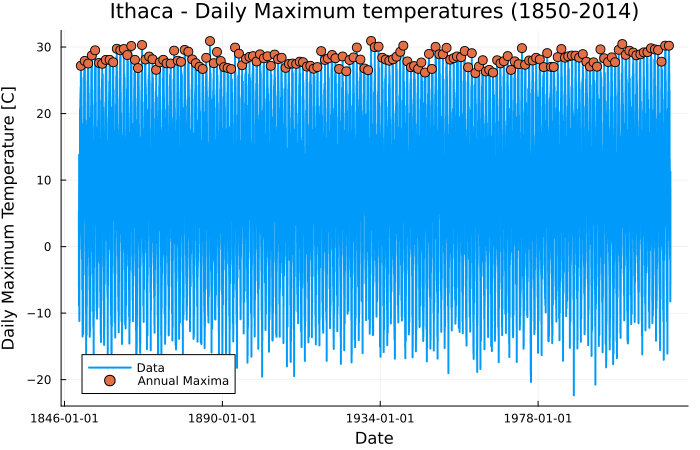

In [4]:
#- Load the (daily maximum) temperature data from `data/gfdl-esm4-tempmax-ithaca.csv`. Find the modeled annual maximum temperatures and plot them.


max_dat = combine(ithaca_dat -> ithaca_dat[argmax(ithaca_dat.TempMax), :], groupby(transform(ithaca_dat, :Day => x->year.(x)), :Day_function))
max_dat = rename(max_dat, :Day_function => "Year")

plot(ithaca_dat.Day, ithaca_dat.TempMax; ylabel="Daily Maximum Temperature [C]", label="Data", linewidth=2, legend=:bottomleft, xlabel="Date",title="Ithaca - Daily Maximum temperatures (1850-2014)")
scatter!(max_dat.Day, max_dat.TempMax, label="Annual Maxima", markersize=5)
plot!(size=(700, 450))

In [5]:
#Fit a stationary GEV model to the annual maximum series and report your parameter estimates. Plot the fitted distribution along with the data. What type of GEV distribution did you end up with? What is the 100-year return level?

init_θ = [30.0, 1.0, 0.01]
gev_lik(θ) = -sum(logpdf(GeneralizedExtremeValue(θ[1], θ[2], θ[3]), max_dat.TempMax))
optimization = Optim.optimize(gev_lik, init_θ)
θ_mle = optimization.minimizer
stat_ll =optimization.minimum

@show θ_mle;

θ_mle = [27.82889211884963, 1.016831932151911, -0.2187833948477759]


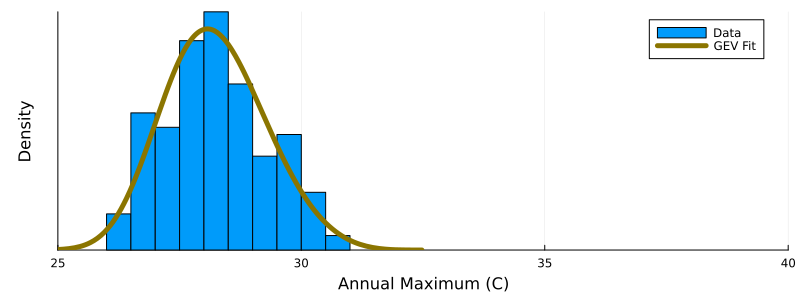

In [25]:
p = histogram(
    max_dat.TempMax,
    normalize=:pdf,
    label="Data",
    xlabel="Annual Maximum (C)",
    ylabel="Density",
    bins=20,
    yticks=[], leftmargin=10Plots.mm,bottommargin=5Plots.mm
)
#θ_mle[1] = 27.8289 #9.55457 
#θ_mle[2] = 1.01684 #43.6482
#θ_mle[3] = -0.218788 #-2.0434

plot!(p,GeneralizedExtremeValue(θ_mle[1], θ_mle[2], θ_mle[3]), linewidth=5, label="GEV Fit", color=:gold4)
xlims!((25, 40))
plot!(size=(800, 300))

In [26]:
gevcdf(x) = cdf(GeneralizedExtremeValue(θ_mle[1], θ_mle[2], θ_mle[3]), x) # find quantiles of values
rl_100 = quantile(GeneralizedExtremeValue(θ_mle[1], θ_mle[2], θ_mle[3]), 0.99)

#plot(1:0.01:1.75, 1 .- gevcdf.(1:0.01:1.75), yaxis=:log, yticks=10 .^ collect(-3.0:1.0:0.0), xlabel="Annual Daily Maximum Temperature [C]", ylabel="Exceedance Probability (1/yr)", lw=3)
#plot!(1:0.01:rl_100, 0.01 .+ zeros(length(1:0.01:rl_100)), color=:red, lw=2)
#plot!(rl_100 .+ zeros(length(-4:0.01:-2)), 10 .^collect(-4.0:0.01:-2.0), color=:red, lw=2)
#scatter!([rl_100], [0.01], color=:red, markersize=5)
#xlims!(26,32)
#plot!(size=(800, 500))

30.777745992125112

In [27]:
rl_100

30.777745992125112

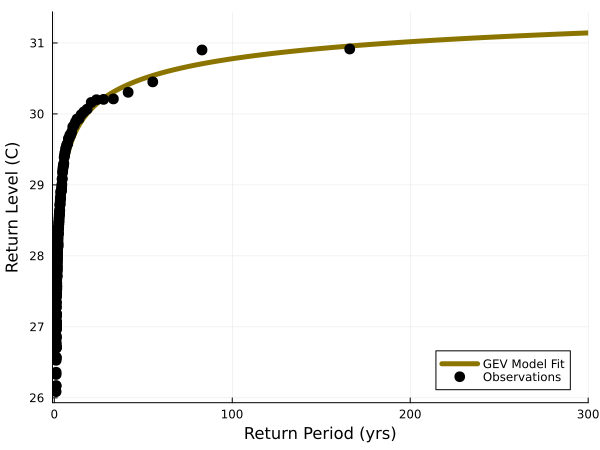

In [28]:
# function to calculate exceedance probability and plot positions based on data quantile
function exceedance_plot_pos(y)
    N = length(y)
    ys = sort(y; rev=false) # sorted values of y
    nxp = xp = [r / (N + 1) for r in 1:N] # exceedance probability
    xp = 1 .- nxp
    return xp, ys
end
xp, ys = exceedance_plot_pos(max_dat.TempMax)

return_periods = 2:500
# get GEV return levels
return_levels = quantile.(GeneralizedExtremeValue(θ_mle[1], θ_mle[2], θ_mle[3]), 1 .- (1 ./ return_periods))

p2 = plot(return_periods, return_levels, linewidth=5, color=:gold4, label="GEV Model Fit", legend=:bottomright)
scatter!(p2, 1 ./ xp, ys, label="Observations", color=:black, markersize=6)
xlabel!(p2, "Return Period (yrs)")
ylabel!(p2, "Return Level (C)")
xlims!(-1, 300)
plot!(p2, size=(600, 450))

In [ ]:
#Now fit a nonstationary GEV with respect to time (only the location parameter should be non-stationary),$y \sim \text{GEV}(\mu_0 + \mu_1 t, \sigma, \xi)$ (for scaling purposes, begin with $t=0$ corresponding to 1850).

function log_gev_nst_pdf(_x,_y, β₀,β₁, σ, ξ)
    μ = _y * β₁ + β₀
    x = (_x - μ) / σ
    tx = if abs(ξ) < 1e-10 # this cutoff is _not_ the same as for log_gpd_pdf.
      # expansion near zero.
      -x + (x^2) * ξ / 2 - (x^3) * (ξ^2) / 3 + (x^4) * (ξ^3) / 4
    else
      (-1 / ξ) * log(max(0, 1 + x * ξ))
    end
    (ξ + 1) * tx - exp(tx) - log(σ)
  end

init_θ = [30, 0 , 1.0, 0.0]
lb = [-5.0, -5.0 ,0.001, -3.0]
ub = [50.0, 5.0, 70.0, 3.0]
t = collect(0:1:length(max_dat.Year)-1)
loglik_gev(θ) = -sum(log_gev_nst_pdf.(max_dat.TempMax,t, θ[1], θ[2], θ[3], θ[4]))

u =collect(20:.1:50)
cost_min = zeros(length(u))
params = zeros(length(u),5)
inner_optimizer = LBFGS(linesearch=LineSearches.BackTracking(order=2))

for i = 1:length(cost_min)
    #print(i,"\n")
    init_θ[1] = u[i]
    cost_min[i] = Inf
    try
        # Use try/catch to handle optimization failures
        solv = Optim.optimize(loglik_gev, lb, ub, init_θ)
        
        # Check if optimization converged and result is finite
        if Optim.converged(solv) && isfinite(solv.minimum)
            cost_min[i] = solv.minimum
            params[i,:] = vcat(solv.minimizer, solv.minimum)
        end
    catch e
        println("Optimization failed for μ = $(u[i]): $e")
        # Keep the Inf value in cost_min[i]
    end
end

In [30]:
nonstat_ll = cost_min[argmin(cost_min)]
θ = params[argmin(cost_min),:]

5-element Vector{Float64}:
  27.66592343235424
   0.0020309145046567547
   1.0157490985672721
  -0.2212281492588728
 242.79573966886565

In [31]:
#100 yr return level from nonstationary GEV 
p = 1/100
y = -log(1-p)
z_nstn = (θ[1].+θ[2].*t ).- θ[3]/(θ[4]) * (1 - (y)^(-θ[4]));

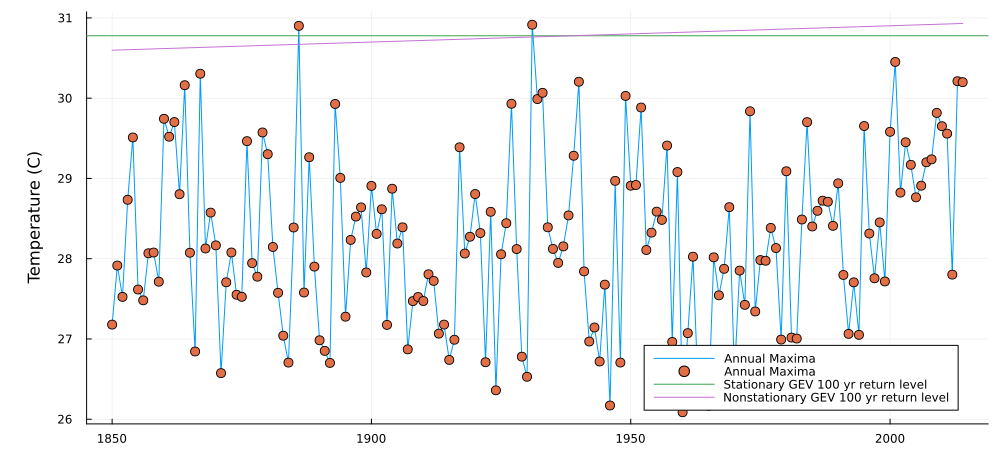

In [32]:
#plot(ithaca_dat.Day, ithaca_dat.TempMax; ylabel="Daily Maximum Temperature [C]", label="Data", linewidth=2, legend=:bottomleft, xlabel="Date",title="Ithaca - Daily Maximum temperatures (1850-2014)")
plot(max_dat.Year, max_dat.TempMax, label="Annual Maxima", markersize=5,ylabel="Temperature (C)",leftmargin=10Plots.mm)
scatter!(max_dat.Year, max_dat.TempMax, label="Annual Maxima", markersize=5)
hline!([rl_100],label="Stationary GEV 100 yr return level")
plot!(max_dat.Year,z_nstn,label="Nonstationary GEV 100 yr return level")
plot!(size=(1000, 450))

In [33]:
# What are the AIC values for each model? What can you conclude about the relative evidence for non-stationarity?
stat_aic = -2 *(stat_ll - 3)
nonstat_aic = -2 *(nonstat_ll -4)
print("AIC_stationary: ",round(stat_aic,digits=2)," \nAIC_nonstationary: ",round(nonstat_aic,digits=2),"\n")

AIC_stationary: -480.93 
AIC_nonstationary: -477.59


In [34]:
dAIC = -477.59 + 480.93 

3.340000000000032

### Problem 2

Now let’s analyze how often of the Ithaca temperature data.

**In this problem**:

-   Suppose that we were interested in looking at temperature
    exceedances over 28°C. Decluster these occurrences and plot the
    number of exceedances by year. Have they increased over time?
-   Fit a stationary Poisson-GPD model for the exceedances. What does
    the GPD distribution look like?
-   From your model, estimate the 100-year return level. How does it
    differ from the 100-year return period from the stationary model in
    Problem 1? Why do you think it agrees or disagrees?

**Answer:**

Exceedances by year seems to have increased since the year 2000, peaking in 2013. Before that, there's not clear trend in the series.

The GPD distribution is bounded, $\xi$ < 0 

The 100yr return level estimated by the GPD fit is 30.91C, while the stationary GEV is 30.78C. I think both models resulted in very similar return levels for a few reasons:

- The GEV was fitted using 165 annual maximum temperature. For the GPD, after declustering there was 164 threshold exceedances for the fit. Basically the two models were fitted using the same ammount of data.

- For the GEV, we assumed 1 year was a reasonable block size to consider the data points independents. The GPD result being similar to the GEV, shows this assumption is reasonable.

In [36]:
# cluster data points which occur within period
function assign_cluster(dat, period)
    cluster_index = 1
    clusters = zeros(Int, length(dat))
    for i in 1:length(dat)
        if clusters[i] == 0
            clusters[findall(abs.(dat .- dat[i]) .<= period)] .= cluster_index
            cluster_index += 1
        end
    end
    return clusters
end

assign_cluster (generic function with 1 method)

In [37]:
#Parameters
thresh = 28 #Threshold

28

In [38]:
ithaca_dat[!, :year] = year.(ithaca_dat[!, "Day"]);

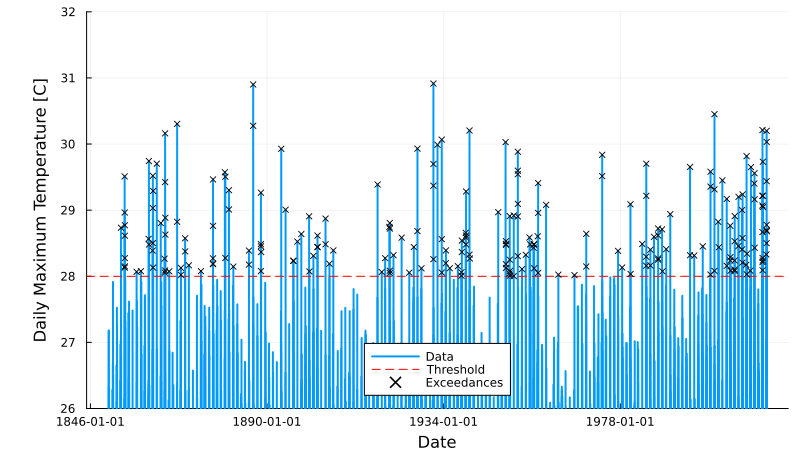

In [40]:
p1 = plot(ithaca_dat.Day, ithaca_dat.TempMax; linewidth=2,  ylabel="Daily Maximum Temperature [C]",label="Data", legend=:bottom, xlabel="Date",leftmargin=10Plots.mm)
hline!([thresh], color=:red, linestyle=:dash, label="Threshold")
scatter!(ithaca_dat.Day[ithaca_dat.TempMax .> thresh], ithaca_dat.TempMax[ithaca_dat.TempMax .> thresh], markershape=:x, color=:black, markersize=3, label="Exceedances")
plot!(size=(800, 450))
ylims!(26,32)

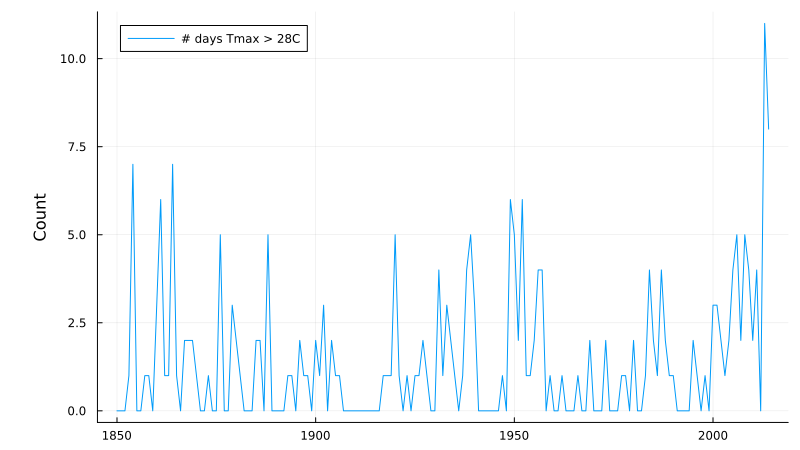

In [41]:
yearly_exceedance=combine(ithaca_dat -> count(ithaca_dat.TempMax .> thresh), groupby(ithaca_dat, :year));
plot(yearly_exceedance.year,yearly_exceedance.x1,label="# days Tmax > 28C",ylabel="Count",leftmargin=10Plots.mm)
plot!(size=(800, 450))

In [42]:
# find total number of exceedances and exceedance times
S = findall(ithaca_dat.TempMax .> thresh)
N = length(S)
T = diff(S) # get difference between adjacent exceedances
θ = 2 * sum(T)^2 / ((N-1) * sum(T.^2)) # extremal index
@show 1/θ

1 / θ = 2.09063405045207


2.09063405045207

In [43]:
# cluster exceedances that occur within a four-hour window
# @transform is a macro from DataFramesMeta.jl which adds a new column based on a data transformation
dat_exceed = ithaca_dat[ithaca_dat.TempMax .> thresh, :]
dat_exceed = @transform dat_exceed :cluster = assign_cluster(:Day, Dates.Day(2))
# find maximum value within cluster
dat_decluster = combine(dat_exceed -> dat_exceed[argmax(dat_exceed.TempMax), :], 
    groupby(dat_exceed, :cluster));

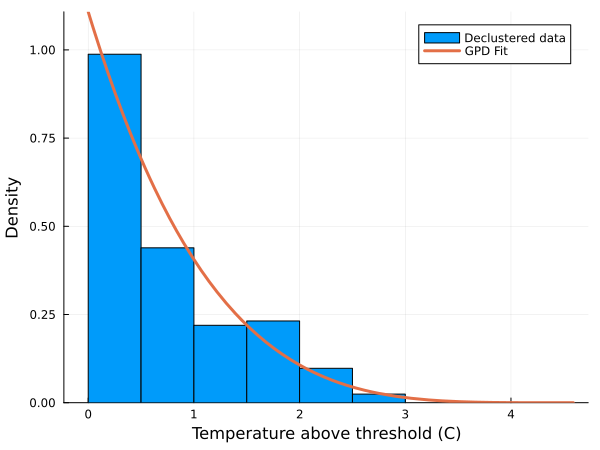

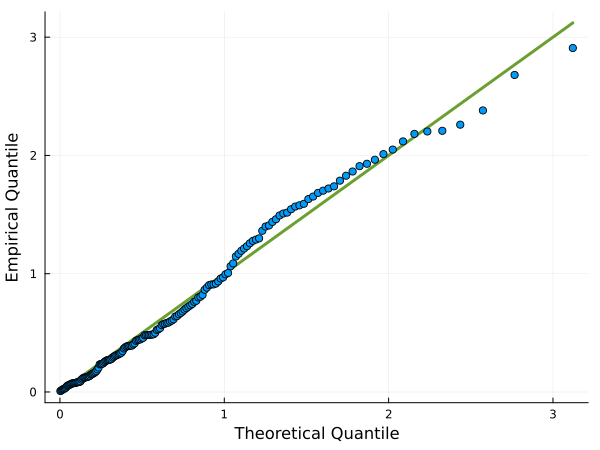

In [44]:
# fit GPD
init_θ = [1.0, 1.0]
low_bds = [0.0, -Inf]
up_bds = [Inf, Inf]
gpd_lik(θ) = -sum(logpdf(GeneralizedPareto(0.0, θ[1], θ[2]), dat_decluster.TempMax .- thresh))
θ_mle = Optim.optimize(gpd_lik, low_bds, up_bds, init_θ).minimizer

gpd = GeneralizedPareto(0.0, θ_mle[1], θ_mle[2])

p = histogram(dat_decluster.TempMax .- thresh,normalize=:pdf,label="Declustered data",ylabel="Density",xlabel="Temperature above threshold (C)")
p1 = plot!(p, gpd, linewidth=3, label="GPD Fit")
plot!(size=(600, 450))

# Q-Q Plot
p2 = qqplot(gpd, dat_decluster.TempMax .- thresh, 
    xlabel="Theoretical Quantile",
    ylabel="Empirical Quantile",
    linewidth=3)
plot!(size=(600, 450))

display(p1)
display(p2)

In [45]:
θ_mle

2-element Vector{Float64}:
  0.9025553026594638
 -0.196622654879828

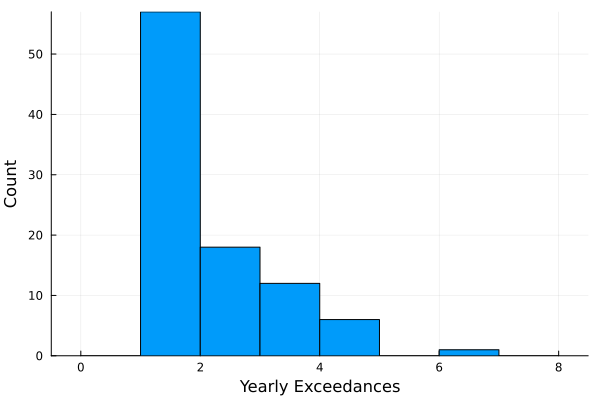

In [46]:
# add column with years of occurrence
#dat_decluster = @transform dat_decluster :year = Dates.year.(dat_decluster.Day)
# group by year and add up occurrences
exceed_counts = combine(groupby(dat_decluster, :year), nrow => :count)
delete!(exceed_counts, nrow(exceed_counts)) # including 2023 will bias the count estimate
p = histogram(exceed_counts.count, legend=:false, 
    xlabel="Yearly Exceedances",
    ylabel="Count",bins = 0:1:8.5
)
plot!(size=(600, 400))

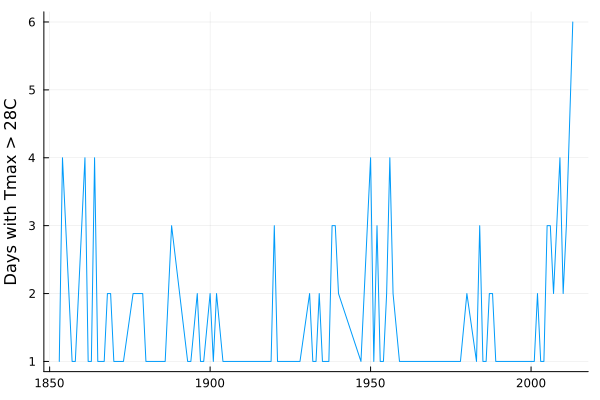

In [47]:
plot(exceed_counts.year,exceed_counts.count,ylabel="Days with Tmax > 28C",label=false)

In [48]:
count_dist = fit(Poisson, exceed_counts.count)
λ = count_dist.λ
x_values = 0:15  # Range of values to calculate PMF for
pmf_values = pdf.(count_dist, x_values)

μ = 0
σ = θ_mle[1]
ξ = θ_mle[2]
m=100
RL = thresh + σ/ξ * ((m*λ)^ξ -1)

30.916458812183304

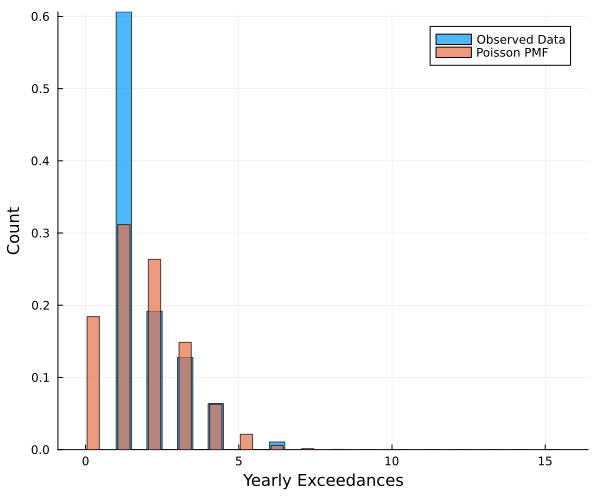

In [49]:
p = histogram(exceed_counts.count, legend=:false, 
    xlabel="Yearly Exceedances",
    ylabel="Count",alpha=0.7,label="Observed Data",
    normalize=:probability#, bins= -2:1:8
)
#plot!(p, count_dist,bar_width=10)
bar!(x_values.+ 0.25,pmf_values,bar_width=0.4,alpha=0.7,label="Poisson PMF")
plot!(size=(600, 500),legend=true)

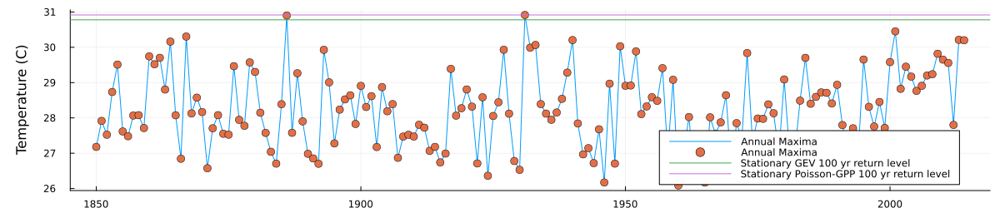

In [50]:
plot(max_dat.Year, max_dat.TempMax, label="Annual Maxima", markersize=5,ylabel="Temperature (C)",leftmargin=10Plots.mm)
scatter!(max_dat.Year, max_dat.TempMax, label="Annual Maxima", markersize=5)
hline!([rl_100],label="Stationary GEV 100 yr return level")
hline!([RL],label="Stationary Poisson-GPP 100 yr return level")
plot!(size=(1200, 250))

### Problem 3

**This problem is only required for students in BEE 5850**.

Let’s examine the influence of air pollution and temperature on
mortality in Chicago, IL. The `data/chicago.csv` dataset (originally
from the [`gamair` `R`
package](https://cran.r-project.org/web/packages/gamair/index.html))contains
data on the relationship between environmental conditions (temperature
and air quality) and deaths in Chicago from 1987–2000. The variables
are:

-   the total number of (non-accidental) deaths each day (`death`);
-   the median density over the city of large pollutant particles (PM10;
    `pm10median`);
-   the median density of smaller pollutant particles (PM2.5;
    `pm25median`);
-   the median concentration of ozone (O$_3$) in the air (`o3median`);
    the median concentration of sulfur dioxide (SO$_2$) in the air
    (`so2median`);
-   the time in days (`time`); and the daily mean temperature (`tmpd`).

The pollution variables have been standardized to represent deviations
from the overall median and the temperature is in Fahrenheit. The days
are given as a number of days relative to December 31, 1993. Note that
some values are missing; these can be treated as missing at random and
dropped in your regressions.

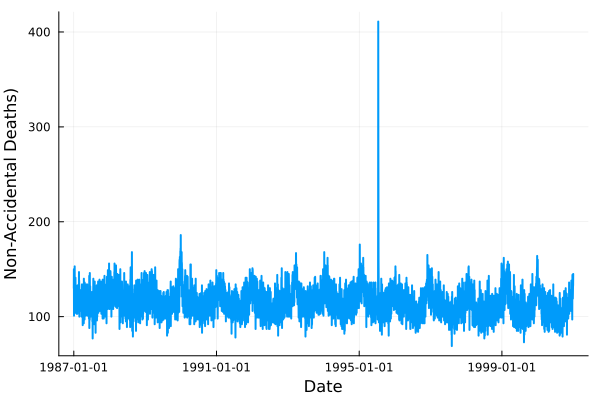

In [51]:
chicago_dat = CSV.read("data/chicago.csv", DataFrame; delim=',', header=true, missingstring="NA")
day_zero = Date("1993-12-31")
chicago_dat.Date = day_zero .+ Day.(chicago_dat.time .+ 0.5)

plot(chicago_dat.Date, chicago_dat.death, lw=2, xlabel="Date", ylabel="Non-Accidental Deaths)", legend=false)

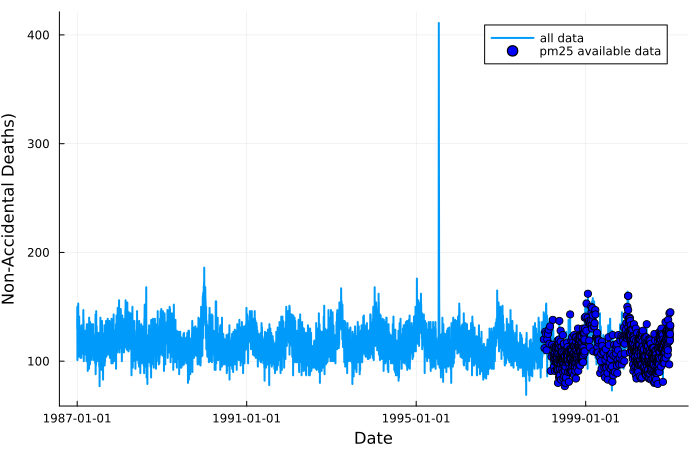

In [52]:
#Missing data
#dropmissing(chicago_dat)
chicago_dat_no_missing = filter(:pm25median => x -> !ismissing(x), chicago_dat);
chicago_dat_no_missing.pm25median = Float64.(chicago_dat_no_missing.pm25median);

plot(chicago_dat.Date, chicago_dat.death, lw=2, xlabel="Date", ylabel="Non-Accidental Deaths)", label="all data")
scatter!(chicago_dat_no_missing.Date, chicago_dat_no_missing.death, lw=2,color=:blue,  label="pm25 available data")
plot!(size=(700, 450))

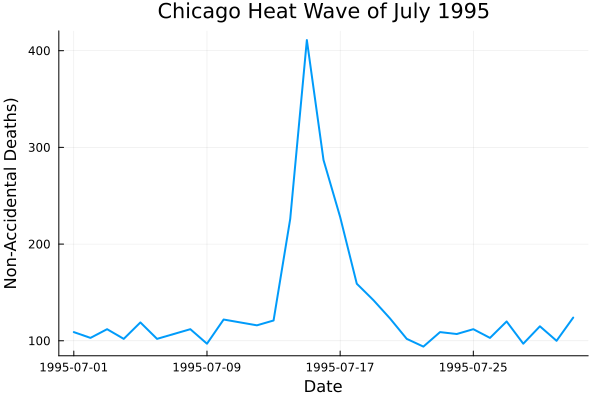

In [53]:
chicago_dat = @transform chicago_dat :year = Dates.yearmonth.(chicago_dat.Date)
dat_subset = filter(:year => x -> x == (1995,7),chicago_dat)
plot(dat_subset.Date, dat_subset.death, lw=2, xlabel="Date", ylabel="Non-Accidental Deaths)",title="Chicago Heat Wave of July 1995", legend=false)

**In this problem**:

-   Load and plot the deaths data. Linearly regress the number of deaths
    against time and report the coefficients for the fitted model. Add
    the regression line to your plot. What does this regression tell
    you?
-   Now linearly regress the deaths data against temperature. Once
    again, report the coefficients, and add the regression line to your
    plot. What does this regression tell you about the influence of
    temperature?
-   Expand your previous model by regressing deaths against temperature
    and PM2.5 density. Report the coefficients and add this regression
    line to your plot.
-   Compute the AICs for the three fitted model and compare them. What
    do they tell you about the relative evidence for the influence of
    temperature and PM2.5 density on deaths? How do your conclusions
    based on AIC compare to those you might draw from your regression
    coefficients and plots?

**Answer:**

Linear regression using time only: 

- $\beta_0$ = 101.65, $\beta_1$ = 0.0
- This regression tells me there's a strong seasonality in the data that is not well represented by a model fitted with time only. The residuals show a seasonality pattern similar to the original number of deaths data, this violates one of the assumptions of the linear regression that the residuals are randomly distributed.

Linear regression using temperature only:

- $\beta_0$ = 129.21, $\beta_1$ = -0.37
- This regression tells me the temperature is a better predictor than time to predict number of deaths, probably because the temperature has a clear seasonality. The residuals look randomly distributed around zero, respecting the assumption that the errors are independent and randomly distributed. Though the regression is not great because there's a lot of dispersion in the residuals.

Linear regression using temperature and PM2.5 density:

- $\beta_0$ = 129.29, $\beta_1$ = -0.37, $\beta_2$ = 0.22
- The results are similar to the temperature only regression. The QQ plot shows a slight improvement in the upper tail of the model quantiles in relation to the observed/sample quantiles.

AIC for each model:

- AIC time only: 490.93
- AIC temperature only: 490.93
- AIC temperature + PM 2.5: 492.93

The log-likelihood of the three regressions is the same. I was not expecting that the model with time only would have same AIC than the temperature only model. I believe that, despite the strong seasonality, the residuals from the time only model are simmetrically distributed around zero because the values are positive in the winter and negative in the summer. Therefore, both models are "equally" bad since the residuals range from -20 to 40 in the two models, the only difference being that in the time only model they are distributed according to the seasonality and in the temperature only model the residuals are more randomly distributied. For the temperature + PM 2.5 model, the improvement was marginal compared to the temperature only model, the result of a higher AIC is expected since the model is more complex (one more parameter) but didn't provide substantial improvement in the predicition of deaths.

Looking into other metrics:

RMSE results:
- y(x_time) = 14.11
- y(x_temperature) = 12.39
- y(x_temperature,x_PM2.5) = 12.25

The RMSE shows the time only model has the largest error, despite having the smallest AIC. According to the RMSE, the model with temperature and PM2.5 has the smallest error, combining this information with the other results, we might conclude we're overfitting the model adding the PM2.5 to the regression.

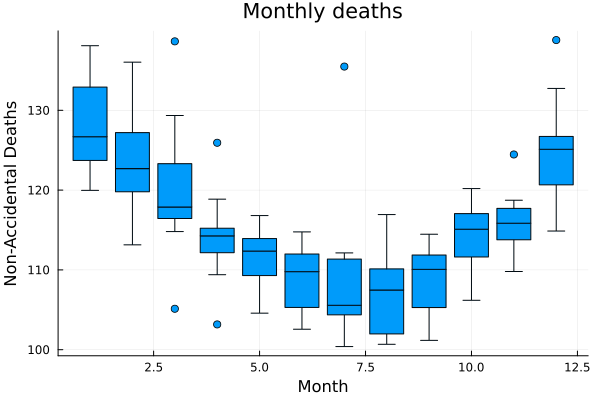

In [54]:
#Deaths seasonality

chicago_dat = @transform chicago_dat :yearmonth = Dates.yearmonth.(chicago_dat.Date)
chicago_dat = @transform chicago_dat :month = Dates.month.(chicago_dat.Date)
chicago_dat = @transform chicago_dat :ndays = Dates.day.(lastdayofmonth.(chicago_dat.Date))

#Missing data
#dropmissing(chicago_dat)
chicago_dat_no_missing = filter(:pm25median => x -> !ismissing(x), chicago_dat);
chicago_dat_no_missing.pm25median = Float64.(chicago_dat_no_missing.pm25median);

temp = combine(chicago_dat -> sum(chicago_dat.death)/minimum(chicago_dat.ndays),groupby(chicago_dat, [:month ,:yearmonth]))
boxplot(temp.month,temp.x1,label=false,xlabel="Month",ylabel="Non-Accidental Deaths",title="Monthly deaths")

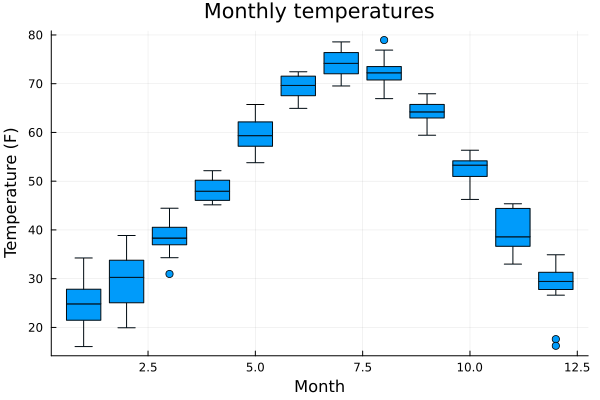

In [55]:
temp = combine(chicago_dat -> mean(chicago_dat.tmpd),groupby(chicago_dat, [:month ,:yearmonth]))
boxplot(temp.month,temp.x1,label=false,xlabel="Month",ylabel="Temperature (F)",title="Monthly temperatures")

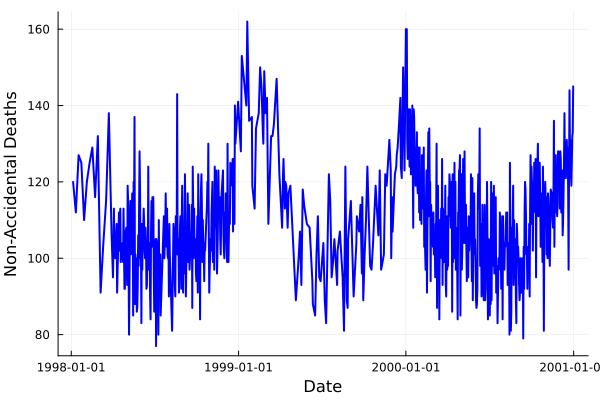

In [56]:
plot(chicago_dat_no_missing.Date, chicago_dat_no_missing.death, lw=2, xlabel="Date", ylabel="Non-Accidental Deaths",color=:blue,  label=false)

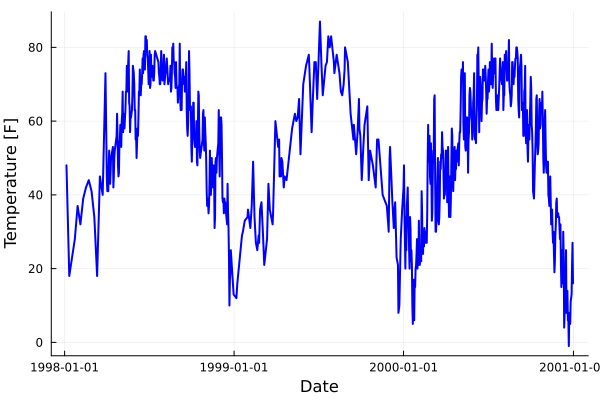

In [57]:
plot(chicago_dat_no_missing.Date, chicago_dat_no_missing.tmpd, lw=2, xlabel="Date", ylabel="Temperature [F]",color=:blue,  label=false)

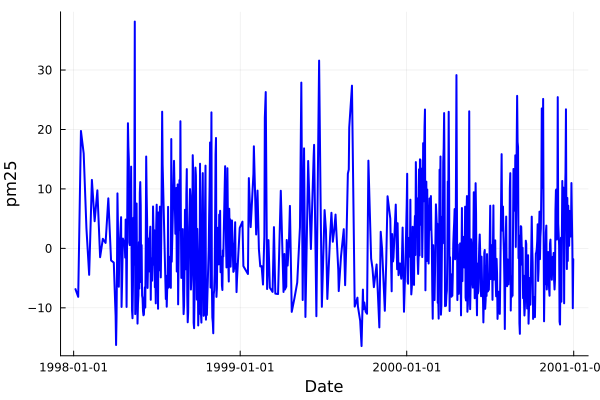

In [58]:
plot(chicago_dat_no_missing.Date, chicago_dat_no_missing.pm25median, lw=2, xlabel="Date", ylabel="pm25",color=:blue,  label=false)

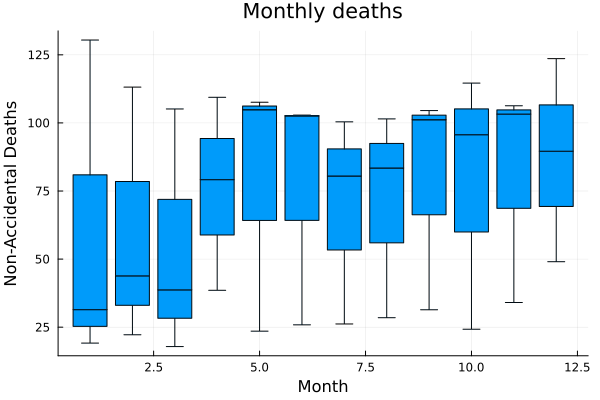

In [59]:
temp = combine(chicago_dat_no_missing -> sum(chicago_dat_no_missing.death)/minimum(chicago_dat_no_missing.ndays),groupby(chicago_dat_no_missing, [:month ,:yearmonth]))
boxplot(temp.month,temp.x1,label=false,xlabel="Month",ylabel="Non-Accidental Deaths",title="Monthly deaths")

**Set likelihood functions**

In [60]:
function ll_simple(θ,_x,_y)
    β₀,β₁,σ = θ
    μ = _x * β₁ .+ β₀
    ll = sum(logpdf.(Normal.(μ,σ),_y))
    return ll
end

function ll_multi(θ,x₁,x₂,_y)
    β₀,β₁,β₂,σ = θ
    μ = x₁ * β₁ .+  x₂ * β₂ .+ β₀
    ll = sum(logpdf.(Normal.(μ,σ),_y))
    return ll
end

ll_multi (generic function with 1 method)

**Regression with time**

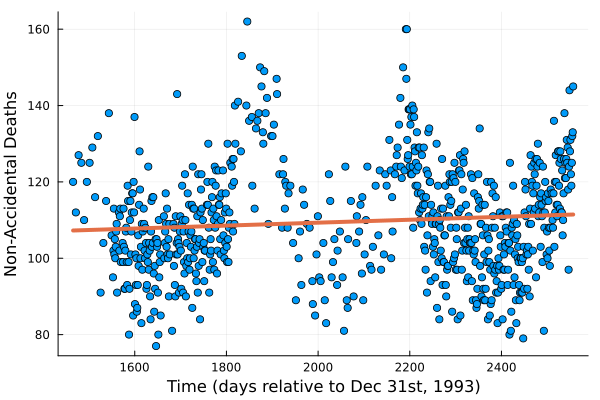

In [61]:
x_time=chicago_dat_no_missing.time
y=chicago_dat_no_missing.death

lm_deaths_time = lm([ones(length(x_time)) x_time], y)

xpred = collect(minimum(x_time):0.1:maximum(x_time))
y_lm_all = predict(lm_deaths_time, [ones(length(xpred)) xpred])

scatter(x_time, y, lw=2, xlabel="Time (days relative to Dec 31st, 1993)", ylabel="Non-Accidental Deaths", legend=false)
plot!(xpred,y_lm_all,linewidth=4)

In [62]:
lb = [-1000.0, -1000.0, 1.0]
ub = [1000.0, 1000.0, 100.0]
θ₀ = [500.0, 0.0, 50.0]
optim_out = Optim.optimize(θ -> -ll_simple(θ, x_time, y), lb, ub, θ₀)
θ_mle = round.(optim_out.minimizer; digits=2)
ll_time_only = optimization.minimum
@show θ_mle;
@show ll_time_only;

θ_mle = [101.65, 0.0, 14.11]
ll_time_only = 243.4655096426331


In [63]:
lm_deaths_time

LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}:

Coefficients:
─────────────────────────────────────────────────────────────────────────
           Coef.  Std. Error      t  Pr(>|t|)     Lower 95%     Upper 95%
─────────────────────────────────────────────────────────────────────────
x1  101.651       3.3002      30.80    <1e-99  95.1718       108.13
x2    0.00383392  0.00157102   2.44    0.0149   0.000749629    0.00691822
─────────────────────────────────────────────────────────────────────────


In [64]:
r2(lm_deaths_time)

0.008147633670831156

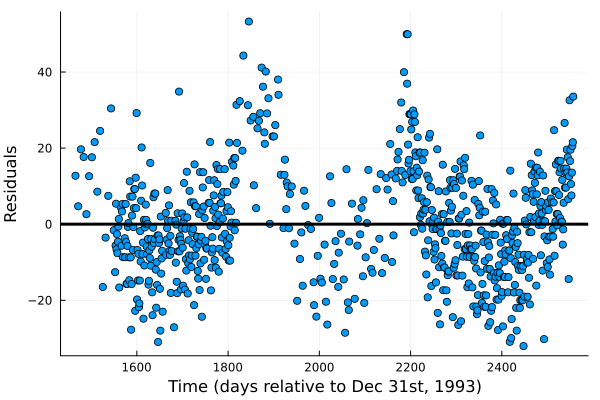

In [65]:
res = y - predict(lm_deaths_time, [ones(length(x_time)) x_time])
scatter(x_time,res,xlabel="Time (days relative to Dec 31st, 1993)", ylabel="Residuals", legend=false)
hline!([0],linewidth=3,color=:black)

In [66]:
sqrt(sum(res.^2)/length(res))

14.114117627217297

In [67]:
sum(res.^2)

144824.44601911123

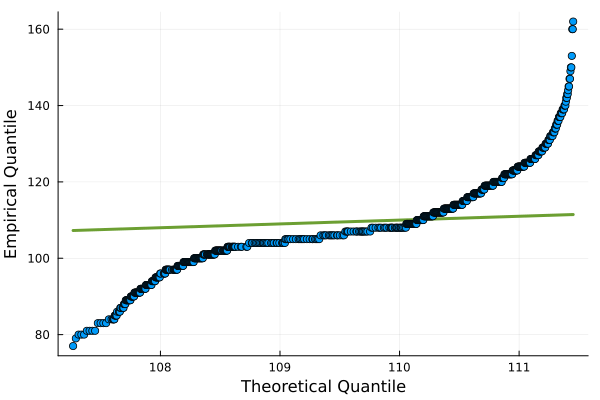

In [68]:
p2 = qqplot(predict(lm_deaths_time, [ones(length(x_time)) x_time]), chicago_dat_no_missing.death, 
    xlabel="Theoretical Quantile",
    ylabel="Empirical Quantile",
    linewidth=3)

**Regression with temperature**

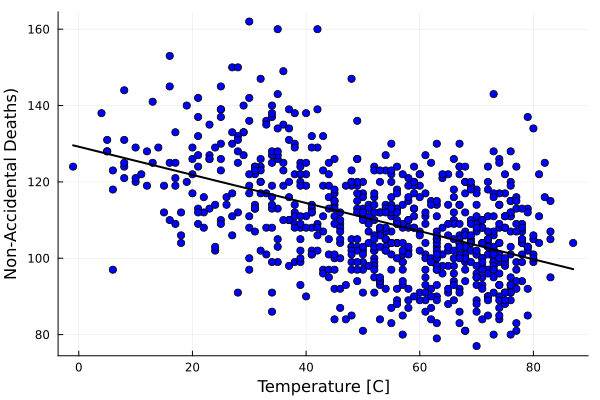

In [69]:
x_tmpd=chicago_dat_no_missing.tmpd
y=chicago_dat_no_missing.death

lm_deaths_tmpd = lm([ones(length(x_tmpd)) x_tmpd], y)

y_lm_all = predict(lm_deaths_tmpd, [ones(length(x_tmpd)) x_tmpd])

#scatter(chicago_dat.tmpd, chicago_dat.death, lw=2, xlabel="Temperature [C]", ylabel="Non-Accidental Deaths)", color=:orange,label="missing pm25")
scatter(chicago_dat_no_missing.tmpd, chicago_dat_no_missing.death, lw=2, xlabel="Temperature [C]", ylabel="Non-Accidental Deaths)",color=:blue,  label=false)
plot!(chicago_dat_no_missing.tmpd,y_lm_all,linewidth=2,label=false,color=:black)

In [70]:
lb = [-1000.0, -1000.0, 1.0]
ub = [1000.0, 1000.0, 100.0]
θ₀ = [500.0, 0.0, 50.0]
optim_out = Optim.optimize(θ -> -ll_simple(θ, x_tmpd, y), lb, ub, θ₀)
θ_mle = round.(optim_out.minimizer; digits=2)
ll_tmpd_only = optimization.minimum
@show θ_mle;
@show ll_tmpd_only;

θ_mle = [129.21, -0.37, 12.39]
ll_tmpd_only = 243.4655096426331


In [71]:
lm_deaths_tmpd

LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}:

Coefficients:
────────────────────────────────────────────────────────────────────
         Coef.  Std. Error       t  Pr(>|t|)   Lower 95%   Upper 95%
────────────────────────────────────────────────────────────────────
x1  129.209      1.39089     92.90    <1e-99  126.478     131.939
x2   -0.368534   0.0246713  -14.94    <1e-43   -0.416969   -0.320098
────────────────────────────────────────────────────────────────────


In [72]:
r2(lm_deaths_tmpd)

0.23534144853267613

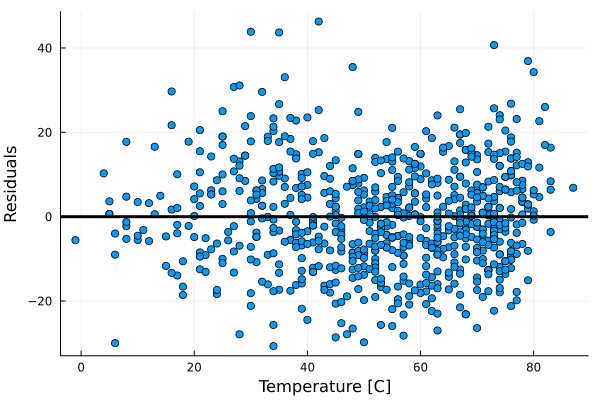

In [73]:
res = y - predict(lm_deaths_tmpd, [ones(length(x_tmpd)) x_tmpd])
scatter(x_tmpd,res,xlabel="Temperature [C]", ylabel="Residuals", legend=false)
hline!([0],linewidth=3,color=:black)

In [74]:
sqrt(sum(res.^2)/length(res))

12.3926444708521

In [75]:
sum(res.^2)

111650.94208514418

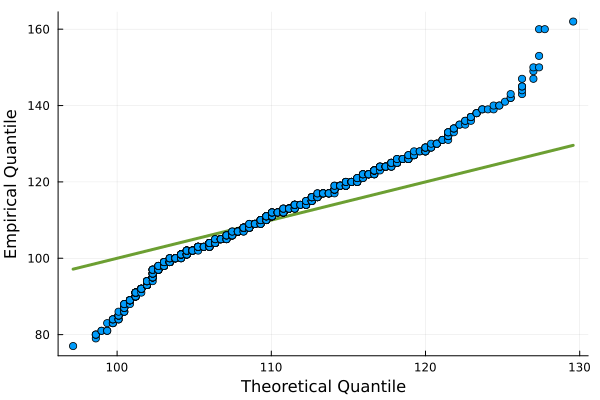

In [76]:
p2 = qqplot(predict(lm_deaths_tmpd, [ones(length(x_tmpd)) x_tmpd]), chicago_dat_no_missing.death, 
    xlabel="Theoretical Quantile",
    ylabel="Empirical Quantile",
    linewidth=3)

**Regression with temperature and pm2.5**

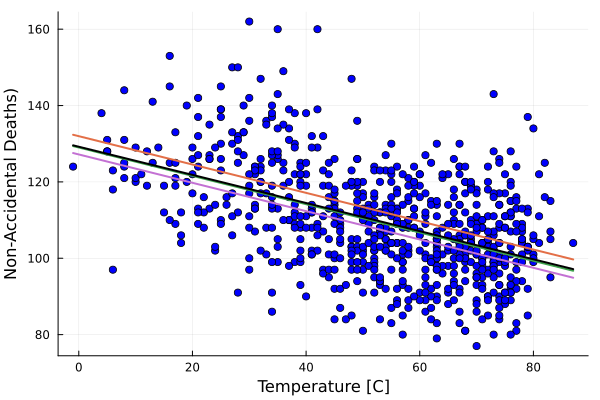

In [77]:
x₁=chicago_dat_no_missing.tmpd
x₂=chicago_dat_no_missing.pm25median
y=chicago_dat_no_missing.death

lm_deaths_tmpd_pm25 = lm([ones(length(x₁)) x₁ x₂], y)

y_lm_high =predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) x₁ repeat(quantile(x₂,[ 0.9]),length(x₁))])
y_lm_mean =predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) x₁ repeat(quantile(x₂,[ 0.5]),length(x₁))])
y_lm_low =predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) x₁ repeat(quantile(x₂,[ 0.1]),length(x₁))])

#scatter(chicago_dat.tmpd, chicago_dat.death, lw=2, xlabel="Temperature [C]", ylabel="Non-Accidental Deaths)", color=:orange,label="missing pm25")
scatter(chicago_dat_no_missing.tmpd, chicago_dat_no_missing.death, lw=2, xlabel="Temperature [C]", ylabel="Non-Accidental Deaths)", legend=false,color=:blue,  label=false)
plot!(chicago_dat_no_missing.tmpd,y_lm_high,linewidth=2)
plot!(chicago_dat_no_missing.tmpd,y_lm_mean,linewidth=2)
plot!(chicago_dat_no_missing.tmpd,y_lm_low,linewidth=2)
plot!(chicago_dat_no_missing.tmpd,predict(lm_deaths_tmpd, [ones(length(x₁)) x₁]),linewidth=2,color=:black)

In [78]:
lb = [-1000.0, -1000.0, -1000.0 , 1.0]
ub = [1000.0, 1000.0, 1000.0, 100.0]
θ₀ = [500.0, 0.0, 0.0, 50.0]
optim_out = Optim.optimize(θ -> -ll_multi(θ, x₁,x₂, y), lb, ub, θ₀)
θ_mle = round.(optim_out.minimizer; digits=2)
ll_tmpd_pm25 = optimization.minimum
@show θ_mle;
@show ll_tmpd_pm25;

θ_mle = [129.29, -0.37, 0.22, 12.25]
ll_tmpd_pm25 = 243.4655096426331


In [79]:
lm_deaths_tmpd_pm25

LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}:

Coefficients:
────────────────────────────────────────────────────────────────────
         Coef.  Std. Error       t  Pr(>|t|)   Lower 95%   Upper 95%
────────────────────────────────────────────────────────────────────
x1  129.294      1.37612     93.96    <1e-99  126.592     131.996
x2   -0.371118   0.0244148  -15.20    <1e-44   -0.41905    -0.323186
x3    0.215328   0.0525154    4.10    <1e-04    0.112227    0.318428
────────────────────────────────────────────────────────────────────


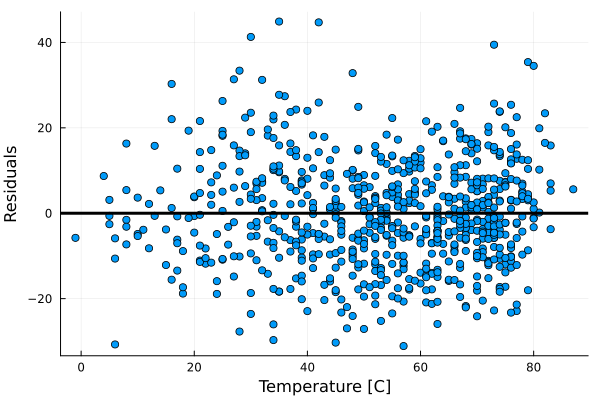

In [80]:
res = y - predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) x₁ x₂])
scatter(x_tmpd,res,xlabel="Temperature [C]", ylabel="Residuals", legend=false)
hline!([0],linewidth=3,color=:black)

In [81]:
sum(res.^2)

109117.09617998898

In [82]:
sqrt(sum(res.^2)/length(res))

12.25121593381372

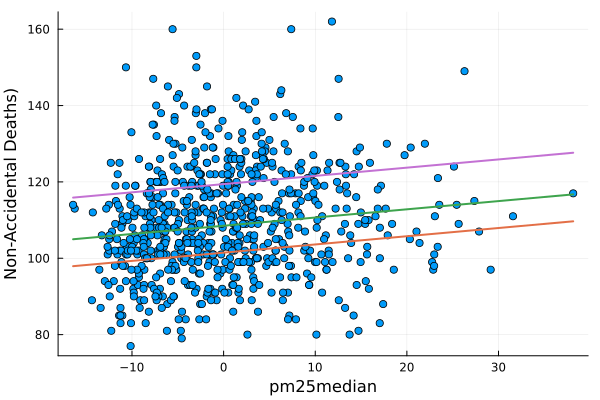

In [83]:
y_lm_high =predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) repeat(quantile(x₁,[ 0.9]),length(x₁)) x₂])
y_lm_mean =predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) repeat(quantile(x₁,[ 0.5]),length(x₁)) x₂])
y_lm_low =predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) repeat(quantile(x₁,[ 0.1]),length(x₁)) x₂])

scatter(chicago_dat_no_missing.pm25median, chicago_dat_no_missing.death, lw=2, xlabel="pm25median", ylabel="Non-Accidental Deaths)", legend=false)
plot!(chicago_dat_no_missing.pm25median,y_lm_high,linewidth=2)
plot!(chicago_dat_no_missing.pm25median,y_lm_mean,linewidth=2)
plot!(chicago_dat_no_missing.pm25median,y_lm_low,linewidth=2)

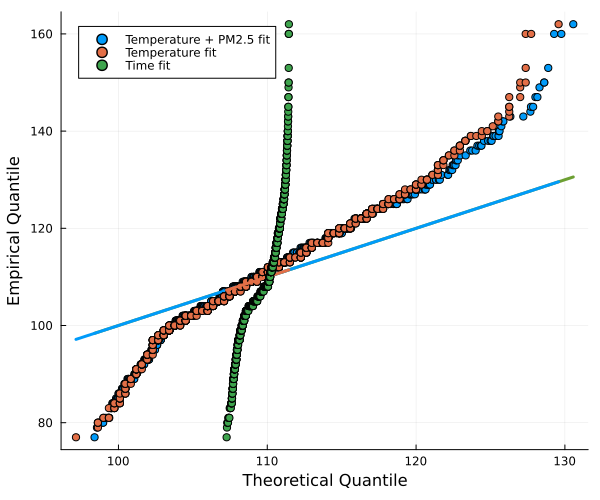

In [84]:
p2 = qqplot(predict(lm_deaths_tmpd_pm25, [ones(length(x₁)) x₁ x₂]), chicago_dat_no_missing.death, 
    xlabel="Theoretical Quantile",
    ylabel="Empirical Quantile",label="Temperature + PM2.5 fit",
    linewidth=3)
qqplot!(predict(lm_deaths_tmpd, [ones(length(x_tmpd)) x_tmpd]), chicago_dat_no_missing.death, 
    ylabel="Theoretical Quantile",
    xlabel="Empirical Quantile",label="Temperature fit",
    linewidth=3)
qqplot!(predict(lm_deaths_time, [ones(length(x_time)) x_time]), chicago_dat_no_missing.death, 
    xlabel="Theoretical Quantile",
    ylabel="Empirical Quantile",label="Time fit",
    linewidth=3)
plot!(size=(600, 500),legend=true)

**AIC**

In [85]:
2 * 2 - 2 * (-ll_time_only)

490.9310192852662

In [86]:
2 * 2 - 2 * (-ll_tmpd_only)

490.9310192852662

In [87]:
2 * 3 - 2 * (-ll_tmpd_pm25)

492.9310192852662